In [1]:
import os
import scanpy as sc
import skmisc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import gzip
from matplotlib.pyplot import rc_context
import anndata as ad  # Importa anndata
import numpy as np

sc.set_figure_params(dpi=100)

In [2]:
import scvi

In [3]:
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

ESTO ES LO QUE HICIMOS AL PRINCIPIO PARA OBTENER DATOS PARA LUEGO PASARLO POR EL SOUPX --> cambiar rutas

In [ ]:
# Diccionario con las rutas para los datos filtrados y raw actualizadas
sample_paths = {
    "PT_14-final_2": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_14-final_2/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_14-final_2/outs/per_sample_outs/PT_14-final_2/count/sample_filtered_feature_bc_matrix.h5'
    },
    "PT_17-final_2": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_17-final_2/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_17-final_2/outs/per_sample_outs/PT_17-final_2/count/sample_filtered_feature_bc_matrix.h5'
    },
    "PT_20-final_2": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_20-final_2/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_20-final_2/outs/per_sample_outs/PT_20-final_2/count/sample_filtered_feature_bc_matrix.h5'
    },
    "PT_22-final_2": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_22-final_2/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_22-final_2/outs/per_sample_outs/PT_22-final_2/count/sample_filtered_feature_bc_matrix.h5'
    },
    "PT_28-final_2": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_28-final_2/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/PT_28-final_2/outs/per_sample_outs/PT_28-final_2/count/sample_filtered_feature_bc_matrix.h5'
    }
}


In [4]:
# Diccionario con las rutas para los nuevos pacientes
new_sample_paths = {
    "PIT_18-final": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/PIT_18-final/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/PIT_18-final/outs/per_sample_outs/PIT_18-final/count/sample_filtered_feature_bc_matrix.h5'
    },
    "PIT_41-final": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/PIT_41-final/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/PIT_41-final/outs/per_sample_outs/PIT_41-final/count/sample_filtered_feature_bc_matrix.h5'
    },
    "P14-pancreas": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/P14-pancreas/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/P14-pancreas/outs/per_sample_outs/P14-pancreas/count/sample_filtered_feature_bc_matrix.h5'
    },
    "PT_49-final": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/PT_49-final/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/PT_49-final/outs/per_sample_outs/PT_49-final/count/sample_filtered_feature_bc_matrix.h5'
    },
    "PT_50-final": {
        "raw": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/PT_50-final/outs/multi/count/raw_feature_bc_matrix.h5',
        "filtered": '/data/scratch/LAB/enric/Proyecto_pitagoras/Resultados_CellRanger/PT_50-final/outs/per_sample_outs/PT_50-final/count/sample_filtered_feature_bc_matrix.h5'
    }
}

In [ ]:
# Comparar el número de células en cada archivo raw y filtrado
for sample_name, paths in sample_paths.items():
    # Cargar los datos raw
    adata_raw = sc.read_10x_h5(paths["raw"])
    
    # Cargar los datos filtrados
    adata_filtered = sc.read_10x_h5(paths["filtered"])
    
    # Obtener el número de células (barcodes) en cada dataset
    n_cells_raw = adata_raw.n_obs
    n_cells_filtered = adata_filtered.n_obs
    
    # Mostrar los resultados
    print(f"{sample_name}:")
    print(f"  Número de células en datos raw: {n_cells_raw}")
    print(f"  Número de células en datos filtrados: {n_cells_filtered}")
    print("-" * 40)


In [5]:
# Comparar el número de células en cada archivo raw y filtrado para los nuevos pacientes
for sample_name, paths in new_sample_paths.items():
    # Cargar los datos raw
    adata_raw = sc.read_10x_h5(paths["raw"])
    
    # Cargar los datos filtrados
    adata_filtered = sc.read_10x_h5(paths["filtered"])
    
    # Obtener el número de células (barcodes) en cada dataset
    n_cells_raw = adata_raw.n_obs
    n_cells_filtered = adata_filtered.n_obs
    
    # Mostrar los resultados
    print(f"{sample_name}:")
    print(f"  Número de células en datos raw: {n_cells_raw}")
    print(f"  Número de células en datos filtrados: {n_cells_filtered}")
    print("-" * 40)

PIT_18-final:
  Número de células en datos raw: 1581
  Número de células en datos filtrados: 1469
----------------------------------------
PIT_41-final:
  Número de células en datos raw: 6438
  Número de células en datos filtrados: 6322
----------------------------------------
P14-pancreas:
  Número de células en datos raw: 237638
  Número de células en datos filtrados: 2028
----------------------------------------
PT_49-final:
  Número de células en datos raw: 379039
  Número de células en datos filtrados: 9335
----------------------------------------
PT_50-final:
  Número de células en datos raw: 362652
  Número de células en datos filtrados: 8383
----------------------------------------


EL 18 y el 41 están demultiplexados y se ha hecho diferente.

In [ ]:
# Cargar los datos filtrados en variables separadas
# Cargar los datos filtrados en variables separadas
pt_14 = sc.read_10x_h5(sample_paths["PT_14-final_2"]["filtered"])
pt_17 = sc.read_10x_h5(sample_paths["PT_17-final_2"]["filtered"])
pt_20 = sc.read_10x_h5(sample_paths["PT_20-final_2"]["filtered"])
pt_22 = sc.read_10x_h5(sample_paths["PT_22-final_2"]["filtered"])
pt_28 = sc.read_10x_h5(sample_paths["PT_28-final_2"]["filtered"])

In [6]:
# Cargar los datos filtrados en variables separadas para los nuevos pacientes
pt_18 = sc.read_10x_h5(new_sample_paths["PIT_18-final"]["filtered"])
pt_41 = sc.read_10x_h5(new_sample_paths["PIT_41-final"]["filtered"])
pt14_pan = sc.read_10x_h5(new_sample_paths["P14-pancreas"]["filtered"])
pt_49 = sc.read_10x_h5(new_sample_paths["PT_49-final"]["filtered"])
pt_50 = sc.read_10x_h5(new_sample_paths["PT_50-final"]["filtered"])

In [ ]:
# Primero para los datos raw
for sample_name, paths in sample_paths.items():
    adata_raw = sc.read_10x_h5(paths["raw"])
    
    # Verificar duplicados antes
    duplicates_before = adata_raw.var_names.duplicated().sum()
    
    # Hacer únicos los nombres de genes
    adata_raw.var_names_make_unique()
    
    # Verificar duplicados después
    duplicates_after = adata_raw.var_names.duplicated().sum()
    
    # Mostrar resultados para raw
    print(f"{sample_name} (raw):")
    print(f"  Duplicados antes: {duplicates_before}")
    print(f"  Duplicados después: {duplicates_after}")

# Ahora para los datos filtrados
for sample_name, adata in zip(
    ["PT_14", "PT_17", "PT_20", "PT_22", "PT_28"],
    [pt_14, pt_17, pt_20, pt_22, pt_28]
):
    # Verificar duplicados antes
    duplicates_before = adata.var_names.duplicated().sum()
    
    # Hacer únicos los nombres de genes
    adata.var_names_make_unique()
    
    # Verificar duplicados después
    duplicates_after = adata.var_names.duplicated().sum()
    
    # Mostrar resultados para filtrados
    print(f"{sample_name} (filtered):")
    print(f"  Duplicados antes: {duplicates_before}")
    print(f"  Duplicados después: {duplicates_after}")


In [7]:
# Primero para los datos raw de los nuevos pacientes
for sample_name, paths in new_sample_paths.items():
    adata_raw = sc.read_10x_h5(paths["raw"])
    
    # Verificar duplicados antes
    duplicates_before = adata_raw.var_names.duplicated().sum()
    
    # Hacer únicos los nombres de genes
    adata_raw.var_names_make_unique()
    
    # Verificar duplicados después
    duplicates_after = adata_raw.var_names.duplicated().sum()
    
    # Mostrar resultados para raw
    print(f"{sample_name} (raw):")
    print(f"  Duplicados antes: {duplicates_before}")
    print(f"  Duplicados después: {duplicates_after}")

# Ahora para los datos filtrados de los nuevos pacientes
for sample_name, adata in zip(
    ["PT_18", "PT_41", "PT14_pan", "PT_49", "PT_50"],
    [pt_18, pt_41, pt14_pan, pt_49, pt_50]
):
    # Verificar duplicados antes
    duplicates_before = adata.var_names.duplicated().sum()
    
    # Hacer únicos los nombres de genes
    adata.var_names_make_unique()
    
    # Verificar duplicados después
    duplicates_after = adata.var_names.duplicated().sum()
    
    # Mostrar resultados para filtrados
    print(f"{sample_name} (filtered):")
    print(f"  Duplicados antes: {duplicates_before}")
    print(f"  Duplicados después: {duplicates_after}")


PIT_18-final (raw):
  Duplicados antes: 22
  Duplicados después: 0
PIT_41-final (raw):
  Duplicados antes: 22
  Duplicados después: 0
P14-pancreas (raw):
  Duplicados antes: 22
  Duplicados después: 0
PT_49-final (raw):
  Duplicados antes: 22
  Duplicados después: 0
PT_50-final (raw):
  Duplicados antes: 22
  Duplicados después: 0
PT_18 (filtered):
  Duplicados antes: 22
  Duplicados después: 0
PT_41 (filtered):
  Duplicados antes: 22
  Duplicados después: 0
PT14_pan (filtered):
  Duplicados antes: 22
  Duplicados después: 0
PT_49 (filtered):
  Duplicados antes: 22
  Duplicados después: 0
PT_50 (filtered):
  Duplicados antes: 22
  Duplicados después: 0


In [ ]:
import os

# Rutas para guardar los archivos h5ad
output_dir_filtered = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices/"
output_dir_raw = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/raw_matrices/"

# Crear los directorios si no existen
os.makedirs(output_dir_filtered, exist_ok=True)
os.makedirs(output_dir_raw, exist_ok=True)

# Guardar los datos raw
for sample_name, paths in sample_paths.items():
    adata_raw = sc.read_10x_h5(paths["raw"])
    adata_raw.var_names_make_unique()  # Asegurar que los nombres de genes sean únicos
    adata_raw.write_h5ad(f"{output_dir_raw}/{sample_name}_raw.h5ad")

# Guardar los datos filtrados
for sample_name, adata in zip(
    ["PT_14", "PT_17", "PT_20", "PT_22", "PT_28"],
    [pt_14, pt_17, pt_20, pt_22, pt_28]
):
    adata.var_names_make_unique()  # Asegurar que los nombres de genes sean únicos
    adata.write_h5ad(f"{output_dir_filtered}/{sample_name}_filtered.h5ad")

In [8]:
# Rutas para guardar los archivos h5ad
output_dir_filtered = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices/"
output_dir_raw = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/raw_matrices/"

# Crear los directorios si no existen
os.makedirs(output_dir_filtered, exist_ok=True)
os.makedirs(output_dir_raw, exist_ok=True)

# Guardar los datos raw para los nuevos pacientes
for sample_name, paths in new_sample_paths.items():
    adata_raw = sc.read_10x_h5(paths["raw"])
    adata_raw.var_names_make_unique()  # Asegurar que los nombres de genes sean únicos
    adata_raw.write_h5ad(f"{output_dir_raw}/{sample_name}_raw.h5ad")

# Guardar los datos filtrados para los nuevos pacientes
for sample_name, adata in zip(
    ["PT_18", "PT_41", "PT14_pan", "PT_49", "PT_50"],
    [pt_18, pt_41, pt14_pan, pt_49, pt_50]
):
    adata.var_names_make_unique()  # Asegurar que los nombres de genes sean únicos
    adata.write_h5ad(f"{output_dir_filtered}/{sample_name}_filtered.h5ad")

In [ ]:
# # Cargar las matrices filtradas
# pt_14_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices/PT_14_filtered.h5ad")
# pt_17_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices/PT_17_filtered.h5ad")
# pt_20_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices/PT_20_filtered.h5ad")
# pt_22_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices/PT_22_filtered.h5ad")
# pt_28_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices/PT_28_filtered.h5ad")

# # Cargar las matrices raw con los nombres correctos
# pt_14_raw = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/raw_matrices/PT_14-final_raw.h5ad")
# pt_17_raw = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/raw_matrices/PT_17-final_raw.h5ad")
# pt_20_raw = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/raw_matrices/PT_20-final_raw.h5ad")
# pt_22_raw = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/raw_matrices/PT_22-final_raw.h5ad")
# pt_28_raw = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/raw_matrices/PT_28-final_raw.h5ad")


CON LAS MATRICES CRUDAS CALCULAMOS EL mRNA AMBIENTAL CON CELLBENDER --> opcional, ya están hechas con SoupX

In [ ]:
# Limpiamos el mRNA ambiental también con Cellbender
!sbatch /data/scratch/LAB/enric/TFM_enric/Analysis_sc_Python/Jupyter_Notebook_Analysis/scripts_auxiliares_jupyter/run_cellbender.sh

CARGAMOS LAS CÉLULAS LIMPIAS DE mRNA ambiental del SoupX detectamos y analizamos dobletes en el jupyter 00_Analisis_dobletes_SOLO.ipynb

### PREPROCESO DE LAS MATRICES LIMPIAS DE mRNA AMBIENTAL y sin dobletes

Antiguas muestras:

In [4]:
import scanpy as sc
import scanpy as sc

# Función para añadir el nombre de la muestra como columna 'Sample' y luego actualizar los nombres de las observaciones
def add_sample_column_and_suffix(adata, sample_name):
    # Añadir la columna 'Sample' en obs
    adata.obs["Sample"] = sample_name
    # Actualizar los nombres de las observaciones con el sufijo del nombre de la muestra
    adata.obs.index = [f"{obs}_{sample_name}" for obs in adata.obs.index]
    return adata

# Cargar las matrices filtradas sin dobletes para cada paciente PT
pt_14_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT_14_sin_doublets.h5ad")
pt_17_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT_17_sin_doublets.h5ad")
pt_20_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT_20_sin_doublets.h5ad")
pt_22_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT_22_sin_doublets.h5ad")
pt_28_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT_28_sin_doublets.h5ad")

# Asignar 'counts_soupx_crude' a X para que sea la capa por defecto en el análisis individual
pt_14_filtered.X = pt_14_filtered.layers['counts_soupx_crude'].copy()
pt_17_filtered.X = pt_17_filtered.layers['counts_soupx_crude'].copy()
pt_20_filtered.X = pt_20_filtered.layers['counts_soupx_crude'].copy()
pt_22_filtered.X = pt_22_filtered.layers['counts_soupx_crude'].copy()
pt_28_filtered.X = pt_28_filtered.layers['counts_soupx_crude'].copy()

# Añadir la columna 'Sample' y el sufijo a los nombres de las observaciones
pt_14_filtered = add_sample_column_and_suffix(pt_14_filtered, "PT14")
pt_17_filtered = add_sample_column_and_suffix(pt_17_filtered, "PT17")
pt_20_filtered = add_sample_column_and_suffix(pt_20_filtered, "PT20")
pt_22_filtered = add_sample_column_and_suffix(pt_22_filtered, "PT22")
pt_28_filtered = add_sample_column_and_suffix(pt_28_filtered, "PT28")

# Concatenar los objetos AnnData de los pacientes PT
adata_concat = sc.concat(
    [pt_14_filtered, pt_17_filtered, pt_20_filtered, pt_22_filtered, pt_28_filtered],
    label="Sample",  # Añadir columna que indica el origen de cada celda
    keys=["PT_14", "PT_17", "PT_20", "PT_22", "PT_28"],
    join="outer"  # Para incluir todas las variables
)

# Mostrar la estructura del objeto concatenado
print(adata_concat)


AnnData object with n_obs × n_vars = 32963 × 38606
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample'
    layers: 'counts_soupx_crude', 'raw_counts', 'soupX_counts'


In [11]:
# Función para realizar las modificaciones en las capas de un AnnData
def modify_layers(adata):
    # Borrar la capa 'soupX_counts'
    if 'soupX_counts' in adata.layers:
        del adata.layers['soupX_counts']
    
    # Cambiar el nombre de la capa 'raw_counts' a 'original_counts'
    if 'raw_counts' in adata.layers:
        adata.layers['original_counts'] = adata.layers.pop('raw_counts')
    
    return adata

In [12]:
# Modificar las capas para cada paciente
pt_14_filtered = modify_layers(pt_14_filtered)
pt_17_filtered = modify_layers(pt_17_filtered)
pt_20_filtered = modify_layers(pt_20_filtered)
pt_22_filtered = modify_layers(pt_22_filtered)
pt_28_filtered = modify_layers(pt_28_filtered)

In [14]:
# Concatenar los objetos AnnData de los pacientes PT
adata_concat_1 = sc.concat(
    [pt_14_filtered, pt_17_filtered, pt_20_filtered, pt_22_filtered, pt_28_filtered],
    label="Sample",  # Añadir columna que indica el origen de cada celda
    keys=["PT_14", "PT_17", "PT_20", "PT_22", "PT_28"],
    join="outer"  # Para incluir todas las variables
)

# Mostrar la estructura del objeto concatenado
print(adata_concat_1)

AnnData object with n_obs × n_vars = 32963 × 38606
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample'
    layers: 'counts_soupx_crude', 'original_counts'


Concatenamos todos los pacientes:

Nuevas muestras:

In [5]:
import scanpy as sc

# Función para añadir el nombre de la muestra como columna 'Sample' y luego actualizar los nombres de las observaciones
def add_sample_column_and_suffix(adata, sample_name):
    # Añadir la columna 'Sample' en obs
    adata.obs["Sample"] = sample_name
    # Actualizar los nombres de las observaciones con el sufijo del nombre de la muestra
    adata.obs.index = [f"{obs}_{sample_name}" for obs in adata.obs.index]
    return adata

# Cargar las matrices filtradas sin dobletes para cada paciente PT
pt_18_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT_18_sin_doublets.h5ad")
pt_14_pan_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT14_pan_sin_doublets.h5ad")
pt_41_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT_41_sin_doublets.h5ad")
pt_49_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT_49_sin_doublets.h5ad")
pt_50_filtered = sc.read_h5ad("/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/02.1_patients_wo_doublets/PT_50_sin_doublets.h5ad")

In [6]:
# Función para realizar las modificaciones en las capas de un AnnData
def modify_layers(adata):
    # Borrar la capa 'soupX_counts'
    if 'soupX_counts' in adata.layers:
        del adata.layers['soupX_counts']
    
    # Cambiar el nombre de la capa 'raw_counts' a 'original_counts'
    if 'raw_counts' in adata.layers:
        adata.layers['original_counts'] = adata.layers.pop('raw_counts')
    
    return adata

In [7]:
# Modificar las capas para cada paciente
pt_18_filtered = modify_layers(pt_18_filtered)
pt_14_pan_filtered = modify_layers(pt_14_pan_filtered)
pt_41_filtered = modify_layers(pt_41_filtered)
pt_49_filtered = modify_layers(pt_49_filtered)
pt_50_filtered = modify_layers(pt_50_filtered)

In [8]:
# Asignar 'counts_soupx_crude' a X para que sea la capa por defecto en el análisis individual
pt_18_filtered.X = pt_18_filtered.layers['counts_soupx_crude'].copy()
pt_14_pan_filtered.X = pt_14_pan_filtered.layers['counts_soupx_crude'].copy()
pt_41_filtered.X = pt_41_filtered.layers['counts_soupx_crude'].copy()
pt_49_filtered.X = pt_49_filtered.layers['counts_soupx_crude'].copy()
pt_50_filtered.X = pt_50_filtered.layers['counts_soupx_crude'].copy()

# Añadir la columna 'Sample' y el sufijo a los nombres de las observaciones
pt_18_filtered = add_sample_column_and_suffix(pt_18_filtered, "PT18")
pt_14_pan_filtered = add_sample_column_and_suffix(pt_14_pan_filtered, "PT14_pan")
pt_41_filtered = add_sample_column_and_suffix(pt_41_filtered, "PT41")
pt_49_filtered = add_sample_column_and_suffix(pt_49_filtered, "PT49")
pt_50_filtered = add_sample_column_and_suffix(pt_50_filtered, "PT50")

# Concatenar los objetos AnnData de los pacientes PT
adata_concat = sc.concat(
    [pt_18_filtered, pt_14_pan_filtered, pt_41_filtered, pt_49_filtered, pt_50_filtered],
    label="Sample",  # Añadir columna que indica el origen de cada celda
    keys=["PT_18", "PT14_pan", "PT_41", "PT_49", "PT_50"],
    join="outer"  # Para incluir todas las variables
)

# Mostrar la estructura del objeto concatenado
print(adata_concat)

AnnData object with n_obs × n_vars = 22159 × 38606
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'Sample'
    layers: 'counts_soupx_crude', 'original_counts'


In [9]:
# Revisar si counts_soupx_crude está normalizado
counts_soupx_crude_totals = pt_18_filtered.layers['counts_soupx_crude'].sum(axis=1).A1  # Suma por célula (convertido a array 1D)
print(f"Suma total por célula en counts_soupx_crude (primeras 10 células): {counts_soupx_crude_totals[:10]}")

# Revisar si original_counts está normalizado
original_counts_totals = pt_18_filtered.layers['original_counts'].sum(axis=1).A1  # Suma por célula (convertido a array 1D)
print(f"Suma total por célula en original_counts (primeras 10 células): {original_counts_totals[:10]}")



Suma total por célula en counts_soupx_crude (primeras 10 células): [ 811.  830. 1045. 2690. 3219. 1660. 1564. 4247. 3335. 1552.]
Suma total por célula en original_counts (primeras 10 células): [1025. 1031. 1156. 3332. 4083. 1903. 1863. 5396. 4057. 1836.]


In [17]:
adata_concat_10_pts = sc.concat(
    [
        pt_14_filtered, pt_17_filtered, pt_20_filtered, pt_22_filtered, pt_28_filtered,
        pt_18_filtered, pt_14_pan_filtered, pt_41_filtered, pt_49_filtered, pt_50_filtered
    ],
    label="Sample",  # Añadir columna que indica el origen de cada celda
    keys=["PT_14", "PT_17", "PT_20", "PT_22", "PT_28",
          "PT_18", "PT14_pan", "PT_41", "PT_49", "PT_50"],
    join="outer"  # Para incluir todas las variables
)

# Mostrar la estructura del objeto concatenado con los 10 pacientes
print(adata_concat_10_pts)

AnnData object with n_obs × n_vars = 55122 × 38606
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'prediction', 'doublet', 'doublet_filtered', 'Sample'
    layers: 'counts_soupx_crude', 'original_counts'


In [18]:
adata_concat_10_pts.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,prediction,doublet,doublet_filtered,Sample
AAACCTGAGAAGAAGC-1_PT14,1719,7.450080,3518.0,8.165932,16.742467,139.0,4.941642,3.951108,singlet,singlet,False,PT_14
AAACCTGAGGACAGAA-1_PT14,2821,7.945201,5976.0,8.695674,13.537483,157.0,5.062595,2.627175,singlet,singlet,False,PT_14
AAACCTGAGTGGAGTC-1_PT14,2638,7.878155,5819.0,8.669056,13.730882,95.0,4.564348,1.632583,singlet,singlet,False,PT_14
AAACCTGAGTGTCTCA-1_PT14,2218,7.704812,5437.0,8.601167,16.075041,63.0,4.158883,1.158727,singlet,singlet,False,PT_14
AAACCTGCAAACTGTC-1_PT14,2212,7.702104,4812.0,8.479075,18.599335,266.0,5.587249,5.527847,singlet,singlet,False,PT_14
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGTGGCTC-1_PT50,2897,7.971776,6532.0,8.784621,16.396203,99.0,4.605170,1.515615,NaN,NaN,<NA>,PT_50
TTTGTCATCGTGGGAA-1_PT50,2471,7.812783,6425.0,8.768107,19.859922,143.0,4.969813,2.225681,NaN,NaN,<NA>,PT_50
TTTGTCATCTGCTGCT-1_PT50,2345,7.760467,5472.0,8.607582,17.616959,109.0,4.700480,1.991959,NaN,NaN,<NA>,PT_50
TTTGTCATCTTGTTTG-1_PT50,2055,7.628518,4491.0,8.410053,17.412603,50.0,3.931826,1.113338,NaN,NaN,<NA>,PT_50


A PARTIR DE AQUI HACEMOS EL PREPROCESAMIENTO. Para ir a la imagen de la presentación, al final:

Antiguos pacientes:

In [11]:
def qc(adata):
   
    # Filtrar células con un número mínimo de genes usando los datos crudos
    sc.pp.filter_cells(adata, min_genes=200)
    
    # Filtrar genes que no están expresados en al menos 3 células usando los datos crudos
    sc.pp.filter_genes(adata, min_cells=3)
    
    # Anotar genes mitocondriales y ribosomales
    adata.var["mt"] = adata.var_names.str.startswith("MT-")  # Genes mitocondriales
    adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))  # Genes ribosomales
    
    # Calcular métricas de QC usando los datos crudos
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo"], inplace=True, percent_top=[20], log1p=True)
   
    return adata

In [3]:
# Aplicar el control de calidad al objeto concatenado
adata = qc(adata_concat)

In [ ]:
# Iterar sobre el índice (barcodes) y modificarlo añadiendo el valor de la columna 'Sample'
#adata.obs.index = adata.obs.apply(lambda x: f"{x.name}_{x['Sample']}", axis=1)

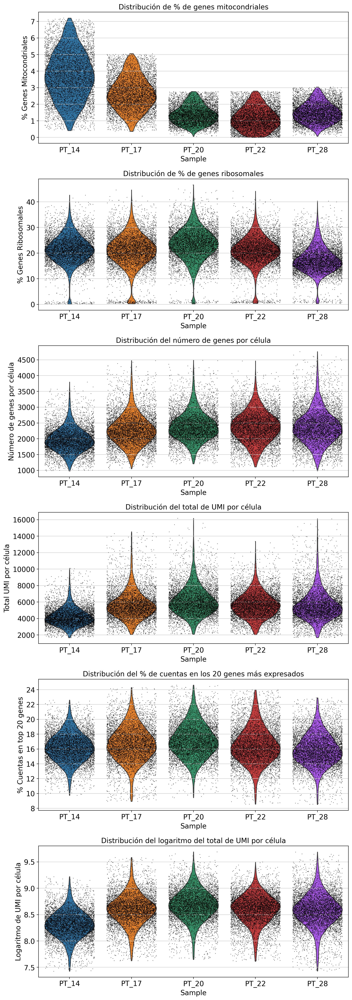

In [6]:
# Crear una figura con subplots para cada métrica
fig, axes = plt.subplots(6, 1, figsize=(10, 28))  # 6 filas, 1 columna

# Generar los violin plots individualmente para cada métrica
sc.pl.violin(adata, "pct_counts_mt", groupby="Sample", jitter=0.4, ax=axes[0], show=False)
axes[0].set_title("Distribución de % de genes mitocondriales")
axes[0].set_ylabel("% Genes Mitocondriales")

sc.pl.violin(adata, "pct_counts_ribo", groupby="Sample", jitter=0.4, ax=axes[1], show=False)
axes[1].set_title("Distribución de % de genes ribosomales")
axes[1].set_ylabel("% Genes Ribosomales")

sc.pl.violin(adata, "n_genes_by_counts", groupby="Sample", jitter=0.4, ax=axes[2], show=False)
axes[2].set_title("Distribución del número de genes por célula")
axes[2].set_ylabel("Número de genes por célula")

sc.pl.violin(adata, "total_counts", groupby="Sample", jitter=0.4, ax=axes[3], show=False)
axes[3].set_title("Distribución del total de UMI por célula")
axes[3].set_ylabel("Total UMI por célula")

sc.pl.violin(adata, "pct_counts_in_top_20_genes", groupby="Sample", jitter=0.4, ax=axes[4], show=False)
axes[4].set_title("Distribución del % de cuentas en los 20 genes más expresados")
axes[4].set_ylabel("% Cuentas en top 20 genes")

sc.pl.violin(adata, "log1p_total_counts", groupby="Sample", jitter=0.4, ax=axes[5], show=False)
axes[5].set_title("Distribución del logaritmo del total de UMI por célula")
axes[5].set_ylabel("Logaritmo de UMI por célula")

# Ajustar los espacios entre subplots
plt.tight_layout()
plt.show()

Nuevos pacientes:

In [12]:
# Aplicar el control de calidad al objeto concatenado
adata_concat = qc(adata_concat)

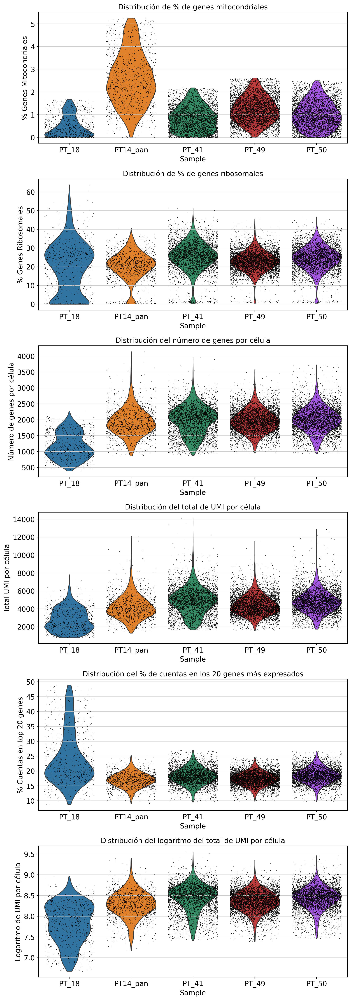

In [13]:
# Crear una figura con subplots para cada métrica
fig, axes = plt.subplots(6, 1, figsize=(10, 28))  # 6 filas, 1 columna

# Generar los violin plots individualmente para cada métrica
sc.pl.violin(adata_concat, "pct_counts_mt", groupby="Sample", jitter=0.4, ax=axes[0], show=False)
axes[0].set_title("Distribución de % de genes mitocondriales")
axes[0].set_ylabel("% Genes Mitocondriales")

sc.pl.violin(adata_concat, "pct_counts_ribo", groupby="Sample", jitter=0.4, ax=axes[1], show=False)
axes[1].set_title("Distribución de % de genes ribosomales")
axes[1].set_ylabel("% Genes Ribosomales")

sc.pl.violin(adata_concat, "n_genes_by_counts", groupby="Sample", jitter=0.4, ax=axes[2], show=False)
axes[2].set_title("Distribución del número de genes por célula")
axes[2].set_ylabel("Número de genes por célula")

sc.pl.violin(adata_concat, "total_counts", groupby="Sample", jitter=0.4, ax=axes[3], show=False)
axes[3].set_title("Distribución del total de UMI por célula")
axes[3].set_ylabel("Total UMI por célula")

sc.pl.violin(adata_concat, "pct_counts_in_top_20_genes", groupby="Sample", jitter=0.4, ax=axes[4], show=False)
axes[4].set_title("Distribución del % de cuentas en los 20 genes más expresados")
axes[4].set_ylabel("% Cuentas en top 20 genes")

sc.pl.violin(adata_concat, "log1p_total_counts", groupby="Sample", jitter=0.4, ax=axes[5], show=False)
axes[5].set_title("Distribución del logaritmo del total de UMI por célula")
axes[5].set_ylabel("Logaritmo de UMI por célula")

# Ajustar los espacios entre subplots
plt.tight_layout()
plt.show()

Probamos diferentes criterios de filtro  para los ANTIGUOS pacientes:

In [14]:
#Hacemos primero la limpieza de los outliers con el median absolute deviation (MAD)
from scipy.stats import median_abs_deviation as mad

# Función MAD para identificar outliers
def mad_outlier(adata, metric, nmads, upper_only=False):
    M = adata.obs[metric]
    if not upper_only:
        return (M < np.median(M) - nmads * mad(M)) | (M > np.median(M) + nmads * mad(M))
    return (M > np.median(M) + nmads * mad(M))

# Función de preprocesamiento utilizando MAD
def pp_mad(adata):
    # Filtrado inicial por porcentaje de genes mitocondriales
    adata = adata[adata.obs.pct_counts_mt < 10]
    
    # Filtrado por MAD en varias métricas
    bool_vector = mad_outlier(adata, 'log1p_total_counts', 5) + \
                  mad_outlier(adata, 'log1p_n_genes_by_counts', 5) + \
                  mad_outlier(adata, 'pct_counts_in_top_20_genes', 5) + \
                  mad_outlier(adata, 'pct_counts_mt', 3, upper_only=True)
    
    # Aplicar filtro
    adata = adata[~bool_vector]

    # Almacenar el número de células eliminadas
    adata.uns['cells_removed'] = sum(bool_vector)

    return adata

# Función de preprocesamiento utilizando límites estándar
def pp_standard(adata):
    # Filtrar por número mínimo de genes detectados
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)
    # Filtrar por porcentaje de genes mitocondriales
    adata = adata[adata.obs.pct_counts_mt < 10]
    
    # Filtrar por límite superior del número de genes detectados
    upper_lim = np.quantile(adata.obs.n_genes_by_counts.values, .98)
    adata = adata[adata.obs.n_genes_by_counts < upper_lim]
    
    # Filtrar por porcentaje de genes ribosomales
    adata = adata[adata.obs.pct_counts_ribo < 40]

    return adata


In [15]:
# Función de preprocesamiento mixto
def pp_mixto(adata, gene_limit=4000, mt_percent=10, ribo_percent=40, min_genes=200, min_cells=3):
    # Filtrar células con un número mínimo de genes
    sc.pp.filter_cells(adata, min_genes=min_genes)
    
    # Filtrar genes que no están expresados en al menos 3 células
    sc.pp.filter_genes(adata, min_cells=min_cells)
    
    # Filtrar por porcentaje de genes mitocondriales
    adata = adata[adata.obs.pct_counts_mt < mt_percent]
    
    # Filtrar por límite superior del número de genes detectados
    adata = adata[adata.obs.n_genes_by_counts < gene_limit]
    
    # Filtrar por porcentaje de genes ribosomales
    adata = adata[adata.obs.pct_counts_ribo < ribo_percent]
    
    # Aplicar filtrado MAD en otras métricas
    bool_vector = mad_outlier(adata, 'log1p_total_counts', 5) + \
                  mad_outlier(adata, 'log1p_n_genes_by_counts', 5) + \
                  mad_outlier(adata, 'pct_counts_in_top_20_genes', 5)
    
    # Aplicar filtro
    adata = adata[~bool_vector]

    # Almacenar el número de células eliminadas
    adata.uns['cells_removed'] = sum(bool_vector)

    return adata

In [9]:
adata_list = [pt_14_filtered,pt_17_filtered,pt_20_filtered,pt_22_filtered,pt_28_filtered]

# Aplicar la función QC a las matrices filtradas
adata_list = [qc(adata.copy()) for adata in adata_list]


In [10]:
# Listas para almacenar los resultados filtrados
adata_list_mad = []
adata_list_standard = []
adata_list_mixto = []

# Aplicar el filtrado utilizando MAD, estándar y mixto a cada ratón
for adata in adata_list:
    adata_mad = pp_mad(adata.copy())
    adata_standard = pp_standard(adata.copy())
    adata_mixto = pp_mixto(adata.copy())
    
    adata_list_mad.append(adata_mad)
    adata_list_standard.append(adata_standard)
    adata_list_mixto.append(adata_mixto)

/home/evercher/tmpdir/ipykernel_16021/2493521274.py:26: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['cells_removed'] = sum(bool_vector)
/home/evercher/tmpdir/ipykernel_16021/2125386573.py:27: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['cells_removed'] = sum(bool_vector)


In [11]:
# Concatenar los datos y añadir un identificador de origen ("Sample")
adata_concat_mad = ad.concat(adata_list_mad, label="Sample", keys=["pt_14","pt_17","pt_20","pt_22","pt_28"])
adata_concat_standard = ad.concat(adata_list_standard, label="Sample", keys=["pt_14","pt_17","pt_20","pt_22","pt_28"])
adata_concat_mixto = ad.concat(adata_list_mixto, label="Sample", keys=["pt_14","pt_17","pt_20","pt_22","pt_28"])

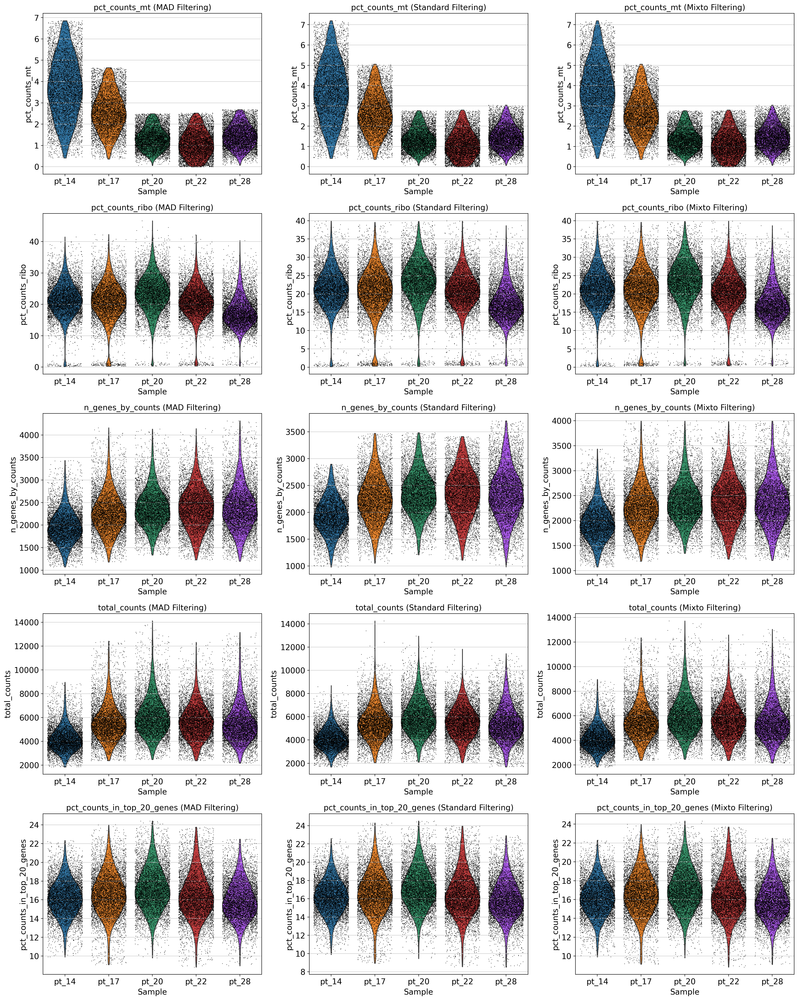

In [12]:
# Métricas a comparar
metrics = ["pct_counts_mt", "pct_counts_ribo","n_genes_by_counts", "total_counts", "pct_counts_in_top_20_genes"]

# Crear una figura con subplots para comparar los métodos de filtrado
fig, axes = plt.subplots(len(metrics), 3, figsize=(20, len(metrics) * 5))

for i, metric in enumerate(metrics):
    # Violin plot para el método MAD
    sc.pl.violin(adata_concat_mad, metric, groupby="Sample", jitter=0.4, ax=axes[i, 0], show=False)
    axes[i, 0].set_title(f"{metric} (MAD Filtering)")

    # Violin plot para el método estándar
    sc.pl.violin(adata_concat_standard, metric, groupby="Sample", jitter=0.4, ax=axes[i, 1], show=False)
    axes[i, 1].set_title(f"{metric} (Standard Filtering)")
    
    # Violin plot para el método mixto
    sc.pl.violin(adata_concat_mixto, metric, groupby="Sample", jitter=0.4, ax=axes[i, 2], show=False)
    axes[i, 2].set_title(f"{metric} (Mixto Filtering)")

# Ajustar los espacios entre subplots
plt.tight_layout()
plt.show()

In [13]:
#checkea las capas que tiene
adata_list_mixto[0].layers.keys()

KeysView(Layers with keys: counts_soupx_crude, raw_counts, soupX_counts)

In [14]:
# Crear el directorio si no existe
output_dir = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc"
os.makedirs(output_dir, exist_ok=True)

# Lista de nombres de muestras correctas
sample_names = ["pt_14", "pt_17", "pt_20", "pt_22", "pt_28"]

# Guardar las matrices filtradas con las capas correctas
for sample_name, adata in zip(sample_names, adata_list_mixto):   
    # Guardar el archivo filtrado
    adata.write_h5ad(f"{output_dir}/{sample_name}_filtered_QC_mixto.h5ad")


APLICAMOS LO MISMO A NUESTROS NUEVOS DATOS:

In [16]:
# Nuevas muestras
adata_list = [
    pt_18_filtered,
    pt_14_pan_filtered,
    pt_41_filtered,
    pt_49_filtered,
    pt_50_filtered
]

# Aplicar la función QC a las matrices filtradas
adata_list = [qc(adata.copy()) for adata in adata_list]

# Listas para almacenar los resultados filtrados
adata_list_mad = []
adata_list_standard = []
adata_list_mixto = []

In [ ]:
# Aplicar el filtrado utilizando MAD, estándar y mixto a cada muestra
for adata in adata_list:
    adata_mad = pp_mad(adata.copy())
    adata_standard = pp_standard(adata.copy())
    adata_mixto = pp_mixto(adata.copy())
    
    adata_list_mad.append(adata_mad)
    adata_list_standard.append(adata_standard)
    adata_list_mixto.append(adata_mixto)

# Concatenar los datos y añadir un identificador de origen ("Sample")
adata_concat_mad = ad.concat(
    adata_list_mad, label="Sample", keys=["pt_18", "pt_14_pan", "pt_41", "pt_49", "pt_50"]
)
adata_concat_standard = ad.concat(
    adata_list_standard, label="Sample", keys=["pt_18", "pt_14_pan", "pt_41", "pt_49", "pt_50"]
)
adata_concat_mixto = ad.concat(
    adata_list_mixto, label="Sample", keys=["pt_18", "pt_14_pan", "pt_41", "pt_49", "pt_50"]
)

# Métricas a comparar
metrics = ["pct_counts_mt", "pct_counts_ribo", "n_genes_by_counts", "total_counts", "pct_counts_in_top_20_genes"]

# Crear una figura con subplots para comparar los métodos de filtrado
fig, axes = plt.subplots(len(metrics), 3, figsize=(20, len(metrics) * 5))

for i, metric in enumerate(metrics):
    # Violin plot para el método MAD
    sc.pl.violin(adata_concat_mad, metric, groupby="Sample", jitter=0.4, ax=axes[i, 0], show=False)
    axes[i, 0].set_title(f"{metric} (MAD Filtering)")

    # Violin plot para el método estándar
    sc.pl.violin(adata_concat_standard, metric, groupby="Sample", jitter=0.4, ax=axes[i, 1], show=False)
    axes[i, 1].set_title(f"{metric} (Standard Filtering)")
    
    # Violin plot para el método mixto
    sc.pl.violin(adata_concat_mixto, metric, groupby="Sample", jitter=0.4, ax=axes[i, 2], show=False)
    axes[i, 2].set_title(f"{metric} (Mixto Filtering)")

# Ajustar los espacios entre subplots
plt.tight_layout()
plt.show()

Eliminamos del pt_18 las celulas con alto pct_counts_in_top_20_genes:

In [22]:
# Filtrar el paciente PT_18 para eliminar células con `pct_counts_in_top_20_genes` > 25
pt_18_filtered = pt_18_filtered[pt_18_filtered.obs['pct_counts_in_top_20_genes'] <= 20].copy()
max_value = pt_18_filtered.obs['pct_counts_in_top_20_genes'].max()
print(f"Máximo valor después del filtrado: {max_value}")

Máximo valor después del filtrado: 20.0


In [ ]:

# Lista actualizada de pacientes con PT_18 filtrado
adata_list = [pt_18_filtered, pt_14_pan_filtered, pt_41_filtered, pt_49_filtered, pt_50_filtered]

# Aplicar QC a las matrices filtradas
adata_list = [qc(adata.copy()) for adata in adata_list]

# Listas para almacenar los resultados filtrados
adata_list_mad = []
adata_list_standard = []
adata_list_mixto = []

# Aplicar el filtrado utilizando MAD, estándar y mixto a cada muestra
for adata in adata_list:
    adata_mad = pp_mad(adata.copy())
    adata_standard = pp_standard(adata.copy())
    adata_mixto = pp_mixto(adata.copy())
    
    adata_list_mad.append(adata_mad)
    adata_list_standard.append(adata_standard)
    adata_list_mixto.append(adata_mixto)

# Concatenar los datos y añadir un identificador de origen ("Sample")
adata_concat_mad = ad.concat(
    adata_list_mad, label="Sample", keys=["pt_18", "pt_14_pan", "pt_41", "pt_49", "pt_50"]
)
adata_concat_standard = ad.concat(
    adata_list_standard, label="Sample", keys=["pt_18", "pt_14_pan", "pt_41", "pt_49", "pt_50"]
)
adata_concat_mixto = ad.concat(
    adata_list_mixto, label="Sample", keys=["pt_18", "pt_14_pan", "pt_41", "pt_49", "pt_50"]
)

# Métricas a comparar
metrics = ["pct_counts_mt", "pct_counts_ribo", "n_genes_by_counts", "total_counts", "pct_counts_in_top_20_genes"]

# Crear una figura con subplots para comparar los métodos de filtrado
fig, axes = plt.subplots(len(metrics), 3, figsize=(20, len(metrics) * 5))

for i, metric in enumerate(metrics):
    # Violin plot para el método MAD
    sc.pl.violin(adata_concat_mad, metric, groupby="Sample", jitter=0.4, ax=axes[i, 0], show=False)
    axes[i, 0].set_title(f"{metric} (MAD Filtering)")

    # Violin plot para el método estándar
    sc.pl.violin(adata_concat_standard, metric, groupby="Sample", jitter=0.4, ax=axes[i, 1], show=False)
    axes[i, 1].set_title(f"{metric} (Standard Filtering)")
    
    # Violin plot para el método mixto
    sc.pl.violin(adata_concat_mixto, metric, groupby="Sample", jitter=0.4, ax=axes[i, 2], show=False)
    axes[i, 2].set_title(f"{metric} (Mixto Filtering)")

# Ajustar los espacios entre subplots
plt.tight_layout()
plt.show()

In [24]:
# Crear el directorio si no existe
output_dir = "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc"
os.makedirs(output_dir, exist_ok=True)

# Lista de nombres de muestras correctas
sample_names = ["pt_18", "pt_14_pan", "pt_41", "pt_49", "pt_50"]

# Guardar las matrices filtradas con las capas correctas
for sample_name, adata in zip(sample_names, adata_list_mixto):   
    # Guardar el archivo filtrado
    adata.write_h5ad(f"{output_dir}/{sample_name}_filtered_QC_mixto.h5ad")

print("Matrices filtradas con el método mixto guardadas correctamente.")

Matrices filtradas con el método mixto guardadas correctamente.


In [25]:
# Lista de rutas para las muestras filtradas por el método mixto
filtered_files = [
    "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_18_filtered_QC_mixto.h5ad",
    "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_14_pan_filtered_QC_mixto.h5ad",
    "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_41_filtered_QC_mixto.h5ad",
    "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_49_filtered_QC_mixto.h5ad",
    "/data/scratch/LAB/enric/Proyecto_pitagoras/Analisis_pitagoras/Results/filtered_matrices_qc/pt_50_filtered_QC_mixto.h5ad"
]

# Nombres de las muestras
sample_names = ["pt_18", "pt_14_pan", "pt_41", "pt_49", "pt_50"]

# Obtener y mostrar el número de células por muestra
for sample_name, file_path in zip(sample_names, filtered_files):
    adata = sc.read_h5ad(file_path)
    print(f"Paciente {sample_name}: {adata.n_obs} células")


Paciente pt_18: 463 células
Paciente pt_14_pan: 1633 células
Paciente pt_41: 4963 células
Paciente pt_49: 7563 células
Paciente pt_50: 6550 células


### Para la presentacion:

In [24]:
def qc(adata):
   
    # Filtrar células con un número mínimo de genes usando los datos crudos
    sc.pp.filter_cells(adata, min_genes=200)
    
    # Filtrar genes que no están expresados en al menos 3 células usando los datos crudos
    sc.pp.filter_genes(adata, min_cells=3)
    
    # Anotar genes mitocondriales y ribosomales
    adata.var["mt"] = adata.var_names.str.startswith("MT-")  # Genes mitocondriales
    adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))  # Genes ribosomales
    
    # Calcular métricas de QC usando los datos crudos
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo"], inplace=True, percent_top=[20], log1p=True)
   
    return adata

In [25]:
# Aplicar el control de calidad inicial
adata_concat_10_pts = qc(adata_concat_10_pts)

In [30]:
#Hacemos primero la limpieza de los outliers con el median absolute deviation (MAD)
from scipy.stats import median_abs_deviation as mad

def mad_outlier(adata, metric, nmads, upper_only=False):
    M = adata.obs[metric]
    if not upper_only:
        return (M < np.median(M) - nmads * mad(M)) | (M > np.median(M) + nmads * mad(M))
    return (M > np.median(M) + nmads * mad(M))

# Función de preprocesamiento mixto
def pp_mixto(adata, gene_limit=4000, mt_percent=10, ribo_percent=40, min_genes=200, min_cells=3):
    # Filtrar células con un número mínimo de genes
    sc.pp.filter_cells(adata, min_genes=min_genes)
    
    # Filtrar genes que no están expresados en al menos 3 células
    sc.pp.filter_genes(adata, min_cells=min_cells)
    
    # Filtrar por porcentaje de genes mitocondriales
    adata = adata[adata.obs.pct_counts_mt < mt_percent]
    
    # Filtrar por límite superior del número de genes detectados
    adata = adata[adata.obs.n_genes_by_counts < gene_limit]
    
    # Filtrar por porcentaje de genes ribosomales
    adata = adata[adata.obs.pct_counts_ribo < ribo_percent]
    
    # Aplicar filtrado MAD en otras métricas
    bool_vector = mad_outlier(adata, 'log1p_total_counts', 5) + \
                  mad_outlier(adata, 'log1p_n_genes_by_counts', 5) + \
                  mad_outlier(adata, 'pct_counts_in_top_20_genes', 5)
    
    # Aplicar filtro
    adata = adata[~bool_vector]

    # Almacenar el número de células eliminadas
    adata.uns['cells_removed'] = sum(bool_vector)

    return adata

In [31]:
# Aplicar el preprocesamiento mixto con los filtros especificados
adata_concat_10_pts = pp_mixto(adata_concat_10_pts)

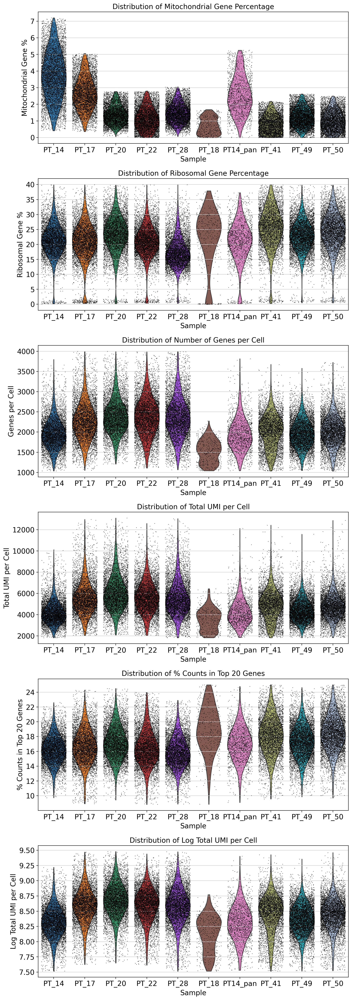

In [34]:
# Crear una figura con subplots para cada métrica
fig, axes = plt.subplots(6, 1, figsize=(10, 28))  # 6 filas, 1 columna

# Generar los violin plots individualmente para cada métrica con ejes y títulos en inglés
sc.pl.violin(adata_concat_10_pts, "pct_counts_mt", groupby="Sample", jitter=0.4, ax=axes[0], show=False)
axes[0].set_title("Distribution of Mitochondrial Gene Percentage")
axes[0].set_ylabel("Mitochondrial Gene %")


sc.pl.violin(adata_concat_10_pts, "pct_counts_ribo", groupby="Sample", jitter=0.4, ax=axes[1], show=False)
axes[1].set_title("Distribution of Ribosomal Gene Percentage")
axes[1].set_ylabel("Ribosomal Gene %")

sc.pl.violin(adata_concat_10_pts, "n_genes_by_counts", groupby="Sample", jitter=0.4, ax=axes[2], show=False)
axes[2].set_title("Distribution of Number of Genes per Cell")
axes[2].set_ylabel("Genes per Cell")

sc.pl.violin(adata_concat_10_pts, "total_counts", groupby="Sample", jitter=0.4, ax=axes[3], show=False)
axes[3].set_title("Distribution of Total UMI per Cell")
axes[3].set_ylabel("Total UMI per Cell")

sc.pl.violin(adata_concat_10_pts, "pct_counts_in_top_20_genes", groupby="Sample", jitter=0.4, ax=axes[4], show=False)
axes[4].set_title("Distribution of % Counts in Top 20 Genes")
axes[4].set_ylabel("% Counts in Top 20 Genes")

sc.pl.violin(adata_concat_10_pts, "log1p_total_counts", groupby="Sample", jitter=0.4, ax=axes[5], show=False)
axes[5].set_title("Distribution of Log Total UMI per Cell")
axes[5].set_ylabel("Log Total UMI per Cell")

# Ajustar los espacios entre subplots
plt.tight_layout()
plt.show()